In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [2]:
def load_text_file(file_name):
    with open(file_name) as f:
        lines = [line.rstrip() for line in f]
    return lines

In [3]:
def build_dictonary_by_key_word_paramter(key_words,number_of_sets,lines):
    key_word_stored_sens_lists=[]
    counter=None
    for l in lines:
        if l in key_words:
            counter = 0
            key_word_temp_list = []
        if '[[' in l and ']]' in l:
            counter+=1
            temp_list = []
            appnd = True
            l = l.replace('[[','')
            l = l.replace(']]','')
            l_split = l.split(' ')
            for i,nmb in enumerate(l_split):
                if nmb != '':
                    nmb = nmb.replace(',','')
                    temp_list.append(float(nmb))
            key_word_temp_list.append(temp_list)
            #counter+=1
            
        if counter == number_of_sets:
            key_word_stored_sens_lists.append(key_word_temp_list)
            counter=0
    
    dict_by_key_words = dict(zip(key_words,key_word_stored_sens_lists))
    return dict_by_key_words

In [4]:
def build_temp_dict(key_words):
    temp_dict = {}
    for word in key_words:
        temp_dict[word] = []
    
    return temp_dict

In [5]:
def convert_units(dict_by_key_words,temp_dict):
    for key in dict_by_key_words:
        for i,reaction_set in enumerate(dict_by_key_words[key]):
            if 'energy' in key or 'Energy' in key:
                temp_arr = np.array(reaction_set)
                temp_arr = temp_arr.reshape((temp_arr.shape[0],1))
                zeros = np.zeros((temp_arr.shape[0],1))
                temp_arr = np.hstack((temp_arr,zeros))
                temp_arr = temp_arr* np.log(10)* 349.757
                temp_dict[key].append(temp_arr)


            else:
                temp_arr = np.array(reaction_set)
                temp_arr = temp_arr.reshape((temp_arr.shape[0],1))
                zeros = np.zeros((temp_arr.shape[0],1))
                temp_arr = np.hstack((temp_arr,zeros))
                temp_arr = temp_arr* np.log(10)
                temp_dict[key].append(temp_arr)

   
    return temp_dict

In [13]:
def convert_units_two(dict_by_key_words,temp_dict,shape=(8,1)):
    for key in dict_by_key_words:
        for i,reaction_set in enumerate(dict_by_key_words[key]):
            if 'energy' in key or 'Energy' in key:
                temp_arr = np.array(reaction_set)
                temp_arr = temp_arr.reshape(shape)
                
                
                temp_arr = temp_arr* np.log(10)* 349.757
                temp_dict[key].append(temp_arr)


            else:
                temp_arr = np.array(reaction_set)
                temp_arr = temp_arr.reshape(shape)
                temp_arr = temp_arr* np.log(10)
                temp_dict[key].append(temp_arr)

   
    return temp_dict

In [14]:
def build_empty_nested_list(temp_dict,key_words):
    empty_nested_list =[]
    for nmb_reactions in range(len(temp_dict[key_words[0]])):
        empty_nested_list.append([])
    return empty_nested_list
    

In [15]:
def breakup_by_reaction(empty_nested_list,key_words,temp_dict):
    for i in range(len(empty_nested_list)):
        for word in key_words:
            empty_nested_list[i].append(temp_dict[word][i])
    return empty_nested_list

In [16]:
key_words = ['B1_Frequencies_1',
             'B1_Energy_1',
             'P2_Energy_1',
             'P2_Frequencies_1',
            'P1_SymmetryFactor_1',
             'P1_Frequencies_1',
             'B1_ImaginaryFrequency_1',
             'P2_SymmetryFactor_1',
             'B1_SymmetryFactor_1',
              'P1_Energy_1']
number_of_sets = 1
file_name = 'Chebyshev_sens_mar_8.txt'


In [17]:
lines=load_text_file('/Users/carlylagrotta/Dropbox/Columbia/MSI/data/branching_reaction_study/o+h2_rate_constant/'+file_name)
dict_by_key_words = build_dictonary_by_key_word_paramter(key_words,number_of_sets,lines)
temp_dict = build_temp_dict(key_words)
temp_dict = convert_units_two(dict_by_key_words,temp_dict)

empty_nested_list = build_empty_nested_list(temp_dict,key_words)

breakup_by_reaction = breakup_by_reaction(empty_nested_list,key_words,temp_dict)




In [18]:


#notebook oct 10th 

reaction_list = ['H2 + O <=> H + OH']
test = dict(zip(reaction_list,breakup_by_reaction))


In [19]:
test

{'H2 + O <=> H + OH': [array([[-9.34496216e-01],
         [-1.00710433e+00],
         [-3.26660057e-01],
         [-9.48041964e-02],
         [-2.82506771e-02],
         [-6.70494022e-03],
         [-5.60569725e-04],
         [ 4.74664906e-04]]),
  array([[-1.34192376e+00],
         [ 1.17419611e+00],
         [-2.02921184e-05],
         [ 4.93571748e-06],
         [-9.31491849e-06],
         [-1.29566288e-05],
         [ 1.02253417e-05],
         [-5.90091574e-06]]),
  array([[0.],
         [0.],
         [0.],
         [0.],
         [0.],
         [0.],
         [0.],
         [0.]]),
  array([[0.],
         [0.],
         [0.],
         [0.],
         [0.],
         [0.],
         [0.],
         [0.]]),
  array([[ 9.99990069e-01],
         [ 2.93244583e-05],
         [-1.75233172e-05],
         [-2.75951077e-06],
         [-3.00886480e-06],
         [-1.55321945e-05],
         [ 9.51939028e-06],
         [-1.63122711e-05]]),
  array([[ 0.12766173],
         [ 0.22408996],
         

In [172]:
def reduced_T( T, T_min, T_max):
    '''Calculate the reduced temperature.'''
    T = np.array(T)
    T_tilde = 2. * T ** (-1.0) - T_min ** (-1.0) - T_max ** (-1.0)
    T_tilde /= (T_max ** (-1.0) - T_min ** (-1.0))
    return T_tilde

def calc_reduced_P(P,P_min,P_max):
        
    numerator = 2*np.log10(P) - np.log10(P_min) - np.log10(P_max)
    denominator = np.log10(P_max) - np.log10(P_min)
    P_reduced = np.divide(numerator,denominator)
    return P_reduced

def calc_chevy(T,P,alpha):
    #calculate rate constants helper function
    T_reduced_list = reduced_T(T,200,2400)
    P_reduced_list = calc_reduced_P(P,.0001,10.0)
    values = np.polynomial.chebyshev.chebval2d(T_reduced_list,P_reduced_list,alpha)

    return values

def plot_sens(dictonary,path,key_words):
    for key in dictonary.keys():
        for j, sens in enumerate(dictonary[key]):
            plt.figure()
            values = calc_chevy(np.arange(200,2400),[1]*2200,sens)
            temp_list = np.arange(200,2400)
            #p_list = np.arange(.0001,10.0)
            plt.plot(temp_list,values)
            plt.title('Reaction: '+key+' '+ 'Parameter: '+ key_words[j])
            plt.xlabel('Temperature (K)')
            plt.ylabel('dln(k)/dln(paramter)')
            plt.savefig(path+'/'+key+'_'+key_words[j]+'.pdf',bbox_inches='tight')
            
def plot_sens2(dictonary,path,key_words,pressure_list):
    for key in dictonary.keys():
        for j, sens in enumerate(dictonary[key]):
            plt.figure()
            for pressure in pressure_list:          
                values = calc_chevy(np.arange(200,2400),[pressure]*2200,sens)
                temp_list = np.arange(200,2400)
                plt.plot(temp_list,values,label=str(pressure)+' atm')
                plt.legend()
                
            plt.title('Reaction: '+key+' '+ 'Parameter: '+ key_words[j])
            plt.xlabel('Temperature (K)')
            plt.ylabel('dln(k)/dln(paramter)')
            plt.savefig(path+'/'+key+'_'+key_words[j]+'.pdf',bbox_inches='tight')

/Users/carlylagrotta/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


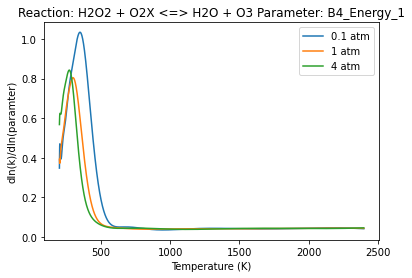

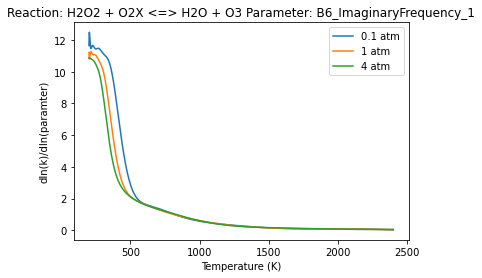

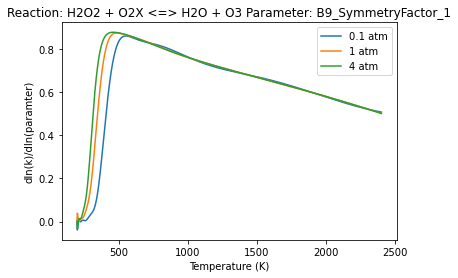

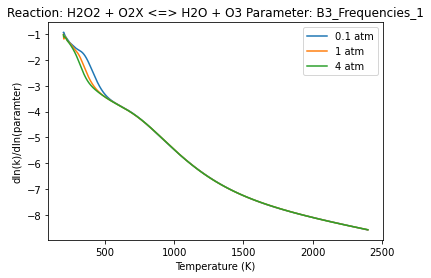

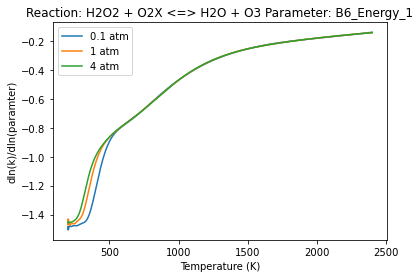

...

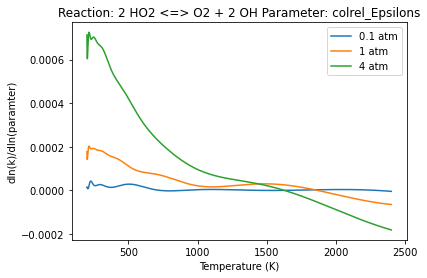

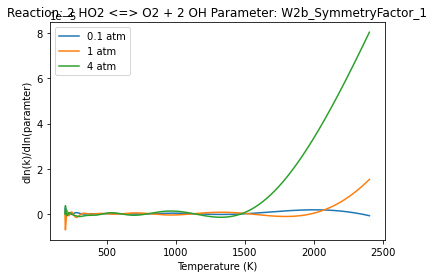

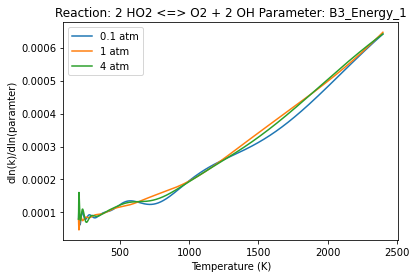

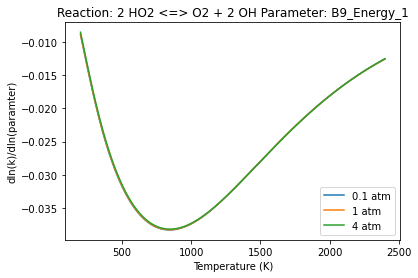

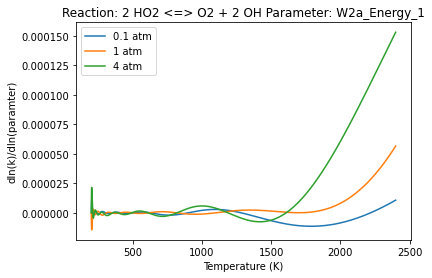

In [173]:
plot_sens2(test,'/Users/carlylagrotta/Dropbox/Columbia/MSI/data/lei_results_testing/Plotting_Sensitivity_HO2_HO2_Oct_6/Singlet',key_words,[.1,1,4])

In [174]:
tst = ['B4_Energy_1',
                     'B6_ImaginaryFrequency_1',
                     'B9_SymmetryFactor_1',
                     'B3_Frequencies_1',
                     'B6_Energy_1',
                     'B6_Frequencies_1',
                     'W2b_Frequencies_1',
                     'B4_SymmetryFactor_1',
                     'W3_Energy_1',
                     'colrel_Sigmas',
                     'B9_Frequencies_1',
                     'W3_SymmetryFactor_1',
                     'B5_Frequencies_1',
                     'B3_SymmetryFactor_1',
                     'B4_Frequencies_1',
                     'B5_SymmetryFactor_1',
                     'W2a_SymmetryFactor_1',
                     'colrel_PowerOne',
                     'colrel_FactorOne',
                     'W2a_Frequencies_1',
                     'W2b_Energy_1',
                     'B3_ImaginaryFrequency_1',
                     'W3_Frequencies_1',
                     'B6_SymmetryFactor_1',
                     'B5_Energy_1',
                     'colrel_Epsilons',
                     'W2b_SymmetryFactor_1',
                     'B3_Energy_1',
                     'B9_Energy_1',
                     'W2a_Energy_1']

In [175]:
len(tst)

30

In [176]:
tst[28]

'B9_Energy_1'

In [177]:
tst[3]

'B3_Frequencies_1'

In [178]:
tst[10]

'B9_Frequencies_1'

In [179]:
tst[24]

'B5_Energy_1'

In [180]:
tst[12]

'B5_Frequencies_1'

"['a', 'b']"